In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import glob
import pickle
import os
from scipy.ndimage import gaussian_filter

plt.rcdefaults()

In [2]:
DATA_PATH = "../data/dataset_pickle"
FILE_EXT = "pickle"


def load_shot(shotno, data_path, file_ext):
    file_path = os.path.join(data_path, f"{shotno}.{file_ext}")
    return pd.read_pickle(file_path)

In [3]:
# get all shot nos
all_shots = [int(os.path.basename(x.split(f".{FILE_EXT}")[0]))
             for x in glob.glob(os.path.join(DATA_PATH, f"*.{FILE_EXT}"))]
if len(all_shots) < 94:  # check if all data is there
    raise ValueError(f"Not all shots found in path /{DATA_PATH}/; found only {len(all_shots)} out of 94")

In [4]:
print(f"List of all shots/pulses:")
print(all_shots)

List of all shots/pulses:
[64374, 64376, 64378, 64389, 64392, 64394, 64401, 64646, 64647, 64648, 64649, 64650, 64658, 64659, 64662, 64664, 64666, 64668, 64670, 64673, 64675, 64677, 64678, 64680, 64682, 64684, 64686, 64770, 64774, 64778, 64820, 64834, 70355, 70356, 70357, 70359, 70380, 70381, 70382, 70383, 70387, 70388, 70389, 70390, 70391, 70392, 70393, 70394, 71182, 71186, 71188, 71189, 71190, 71192, 71193, 71194, 71222, 71223, 71224, 71225, 71226, 71255, 71256, 71259, 71260, 71264, 71265, 71266, 71292, 71300, 71303, 72196, 72198, 72919, 72920, 72925, 72926, 72927, 72928, 72929, 72930, 72959, 72961, 72963, 72964, 72965, 72966, 72967, 73018, 73019, 73020, 73021, 73022, 73023]


In [5]:
shotno = all_shots[3]
#shotno = 71265
data_shot = load_shot(shotno, DATA_PATH, FILE_EXT)

In [6]:
print(f"Example structure of shot #{shotno}:")


def explore_structure(data, indent=0):
    """Recursively prints the structure of nested dictionaries/lists."""
    if isinstance(data, dict):
        for key, value in data.items():
            print('  ' * indent + str(key))
            explore_structure(value, indent + 1)
    elif isinstance(data, list):
        if len(data) > 0:
            print('  ' * indent + f'List of {len(data)} items - showing type of first item')
            explore_structure(data[0], indent + 1)
        else:
            print('  ' * indent + 'Empty List')
    elif isinstance(data, np.ndarray):
        print('  ' * indent + f'NumPy Array - shape: {data.shape}, dtype: {data.dtype}')
    else:
        print('  ' * indent + f'{type(data)}')

#explore_structure(data_shot)
#data_shot['x']['spectrogram']['OddN'].mean()

Example structure of shot #64389:


In [7]:
# Extracting inputs
inputs = data_shot["x"]["spectrogram"]
spec_even = inputs["EvenN"]
spec_odd = inputs["OddN"]
f = inputs["frequency"]
t = inputs["time"]


# Function to plot spectrogram
def plot_spectrogram(spec, title, time, frequency, start_longest_mode=None, end_longest_mode=None):
    fig, ax = plt.subplots()
    ax.imshow(spec.T, extent=(time[0], time[-1], frequency[0], frequency[-1]), aspect='auto', cmap='jet',
              origin='lower')
    ax.set_xlim(time[0], time[-1])
    ax.set_ylim(frequency[0], frequency[-1])
    ax.set_xlabel("Time [s]")
    ax.set_ylabel("Frequency [Hz]")
    fig.set_dpi(150)
    plt.title(title)

    # Plot vertical lines if start and end times are provided
    if start_longest_mode is not None and end_longest_mode is not None:
        ax.axvline(x=start_longest_mode, color='blue', linestyle='--', label='Start of Longest Mode')
        ax.axvline(x=end_longest_mode, color='darkblue', linestyle='--', label='End of Longest Mode')
        plt.legend(loc='upper left')

    plt.show()

In [8]:
#plot_spectrogram(spec_odd, "Odd N", t, f)
#plot_spectrogram(spec_even, "Even N", t, f)

0.00042185053347390414


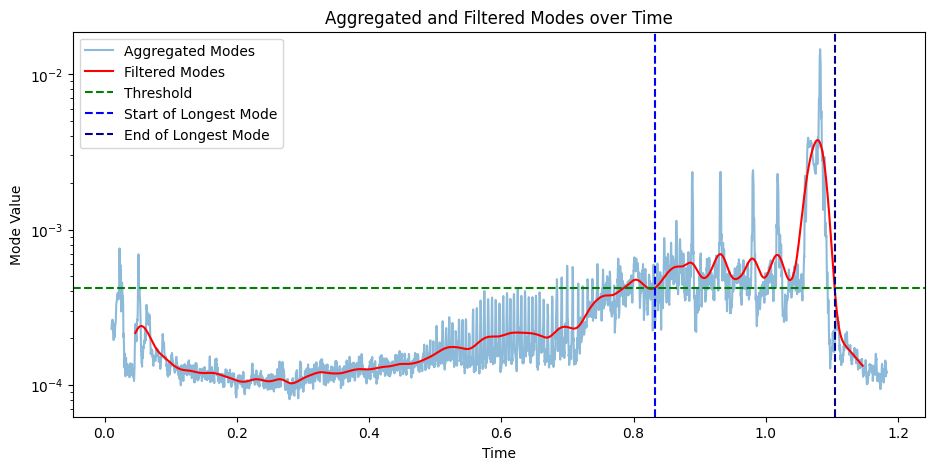

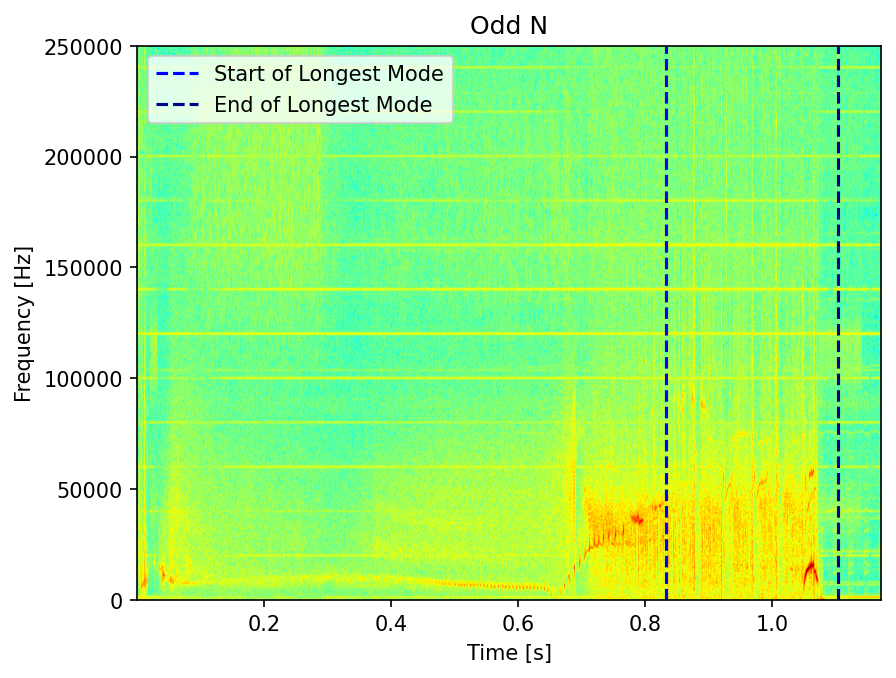

In [9]:
def compute_adaptive_threshold(modes, std_factor, mean_factor):
    if np.all(np.isnan(modes)):
        return np.nan  # Return NaN if all values are NaN
    if np.std(modes) == 0:
        return np.nan  # Return NaN if standard deviation is zero
    mean_val = np.nanmean(modes)  # Use nanmean to ignore NaN values
    std_dev = np.nanstd(modes)  # Use nanstd to ignore NaN values
    
    return mean_factor * mean_val + std_factor * std_dev


def plot_aggregated_modes(label_sources, mode_thresh=0.0005, std_factor=0.25, mean_factor=0.8):
    # Aggregating modes
    modes = np.sum(np.stack([label_sources[f"N{i}"] for i in range(5)]), axis=0) + label_sources["LM"]
    time = label_sources["time"]

    # Applying Gaussian filter
    filtered_modes = gaussian_filter(modes, sigma=45)

    # Calculate adaptive threshold based on the filtered modes
    mode_thresh = compute_adaptive_threshold(filtered_modes, std_factor, mean_factor)
    print(mode_thresh)

    # Find the longest mode segment above the threshold
    above_threshold = filtered_modes > mode_thresh
    change_points = np.diff(above_threshold).nonzero()[0] + 1
    if above_threshold[0]:
        change_points = np.insert(change_points, 0, 0)
    if above_threshold[-1]:
        change_points = np.append(change_points, len(above_threshold))

    segment_lengths = change_points[1::2] - change_points[::2]
    if len(segment_lengths) > 0:
        longest_segment_index = np.argmax(segment_lengths)
        start_longest_mode = time[change_points[2 * longest_segment_index]]
        end_longest_mode = time[change_points[2 * longest_segment_index + 1]]

    # Plotting
    plt.figure(figsize=(11, 5))
    plt.plot(time, modes, label='Aggregated Modes', alpha=0.5)
    plt.plot(time, filtered_modes, label='Filtered Modes', color='red')
    plt.axhline(y=mode_thresh, color='green', linestyle='--', label='Threshold')
    plt.xlabel('Time')
    plt.ylabel('Mode Value')
    plt.title('Aggregated and Filtered Modes over Time')
    plt.yscale('log')

    # Highlight the longest mode segment
    if len(segment_lengths) > 0:
        plt.axvline(x=start_longest_mode, color='blue', linestyle='--', label='Start of Longest Mode')
        plt.axvline(x=end_longest_mode, color='darkblue', linestyle='--', label='End of Longest Mode')

    plt.legend()
    plt.show()

    return (start_longest_mode, end_longest_mode) if len(segment_lengths) > 0 else (None, None)


slm, elm = plot_aggregated_modes(data_shot['y']['modes'])
plot_spectrogram(spec_odd, "Odd N", t, f, slm, elm)

### i

0.0006534651731921367


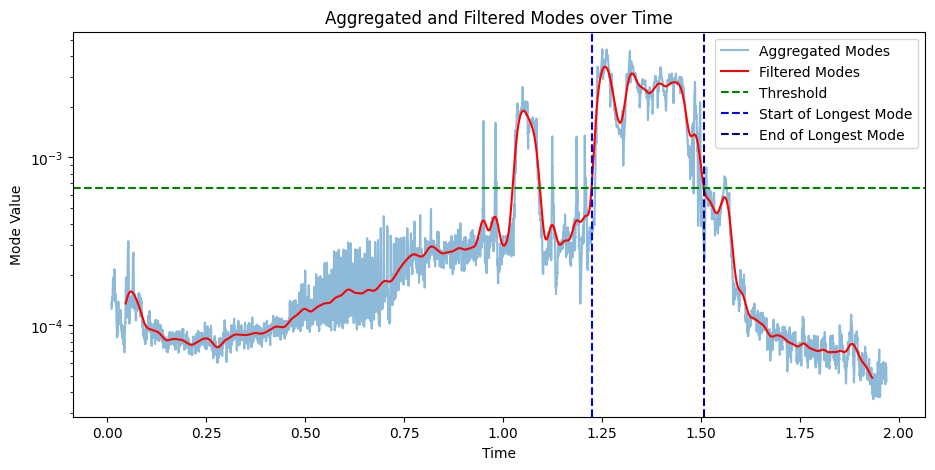

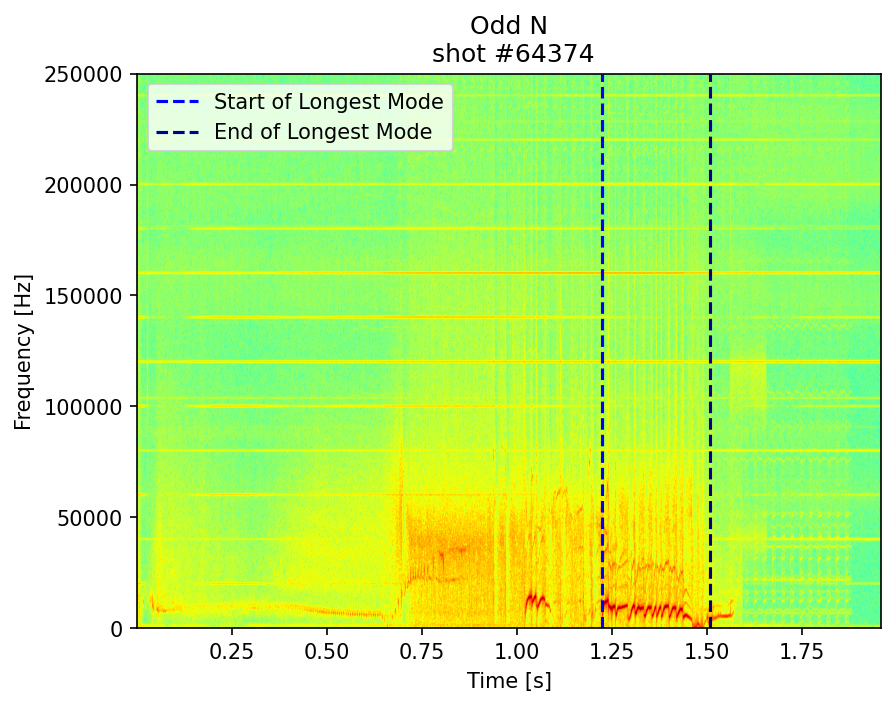

0.0004406824684624223


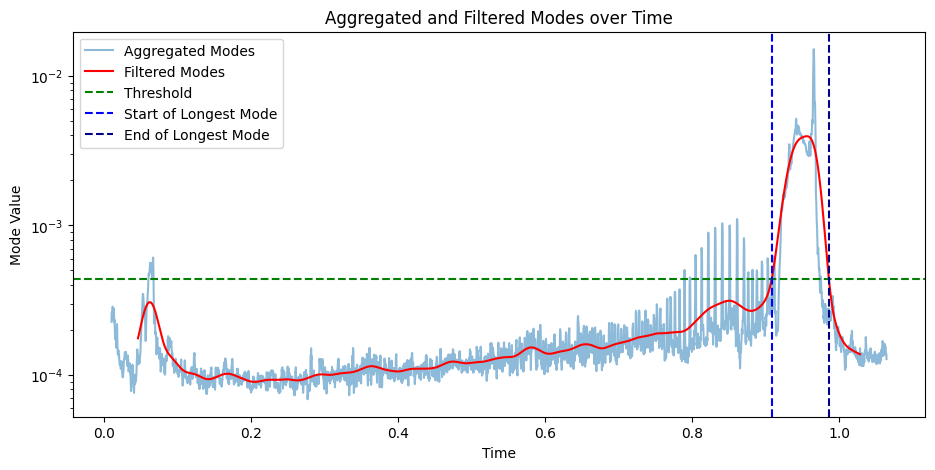

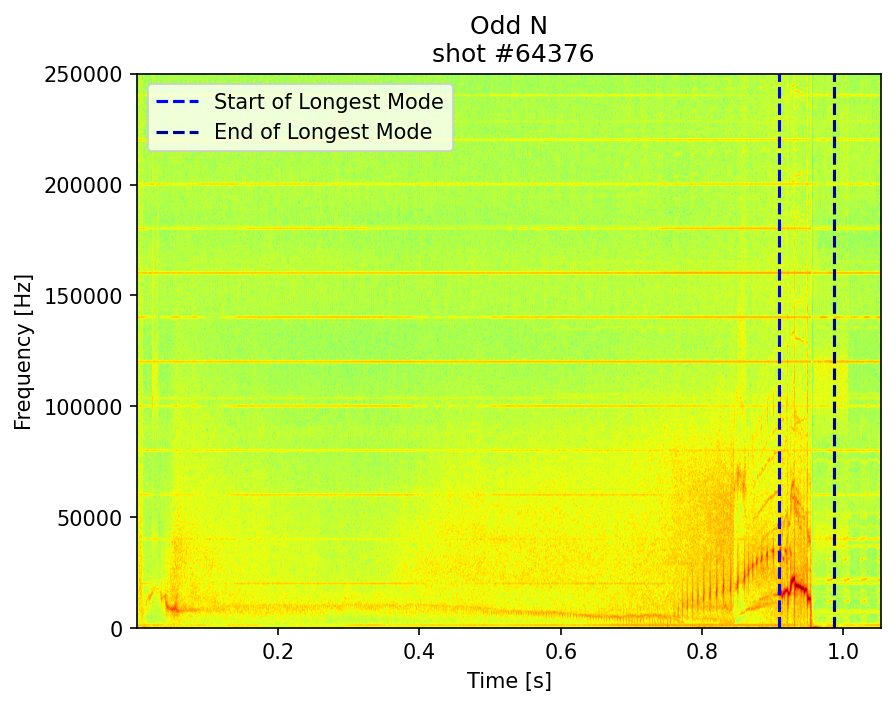

0.00044854202357799905


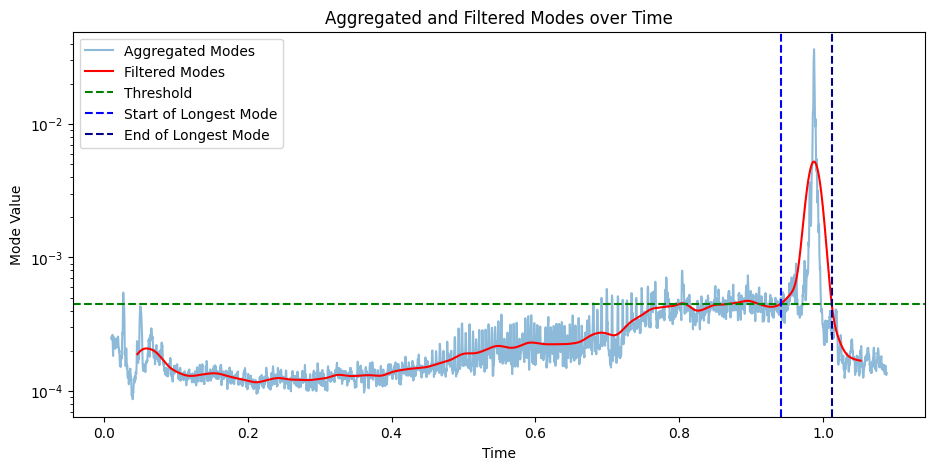

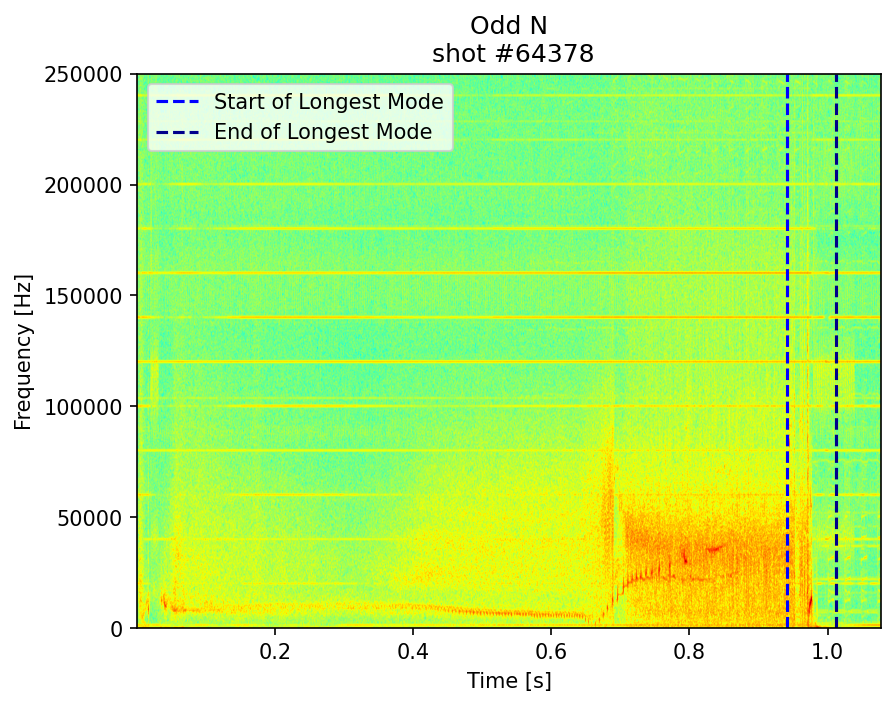

0.00042185053347390414


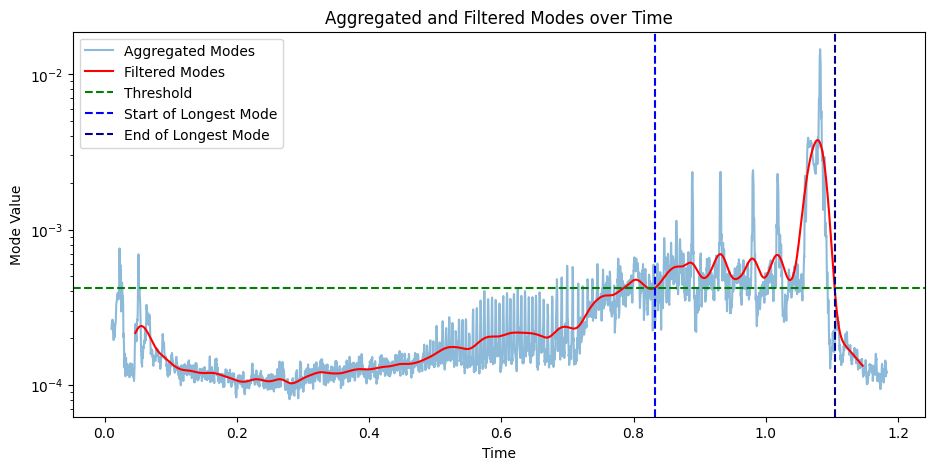

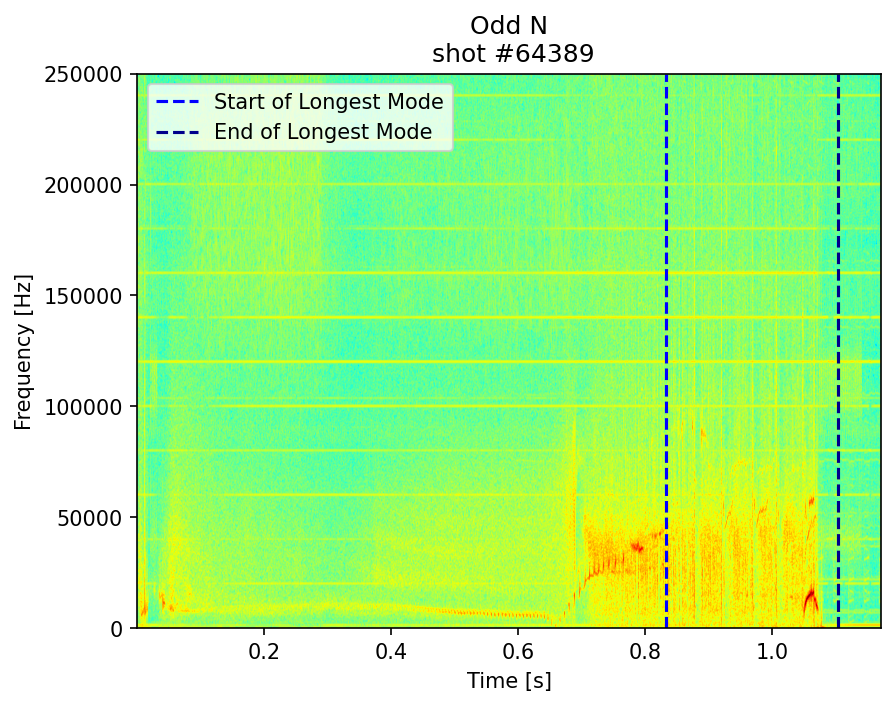

0.0006464324987404417


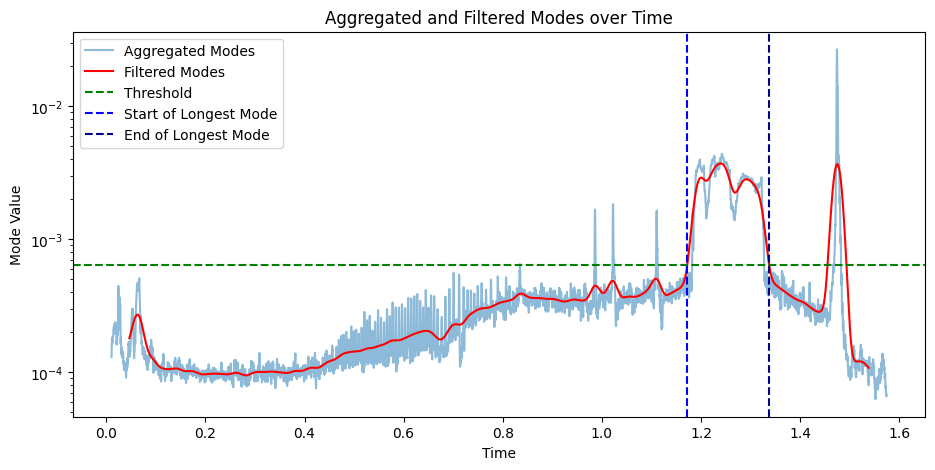

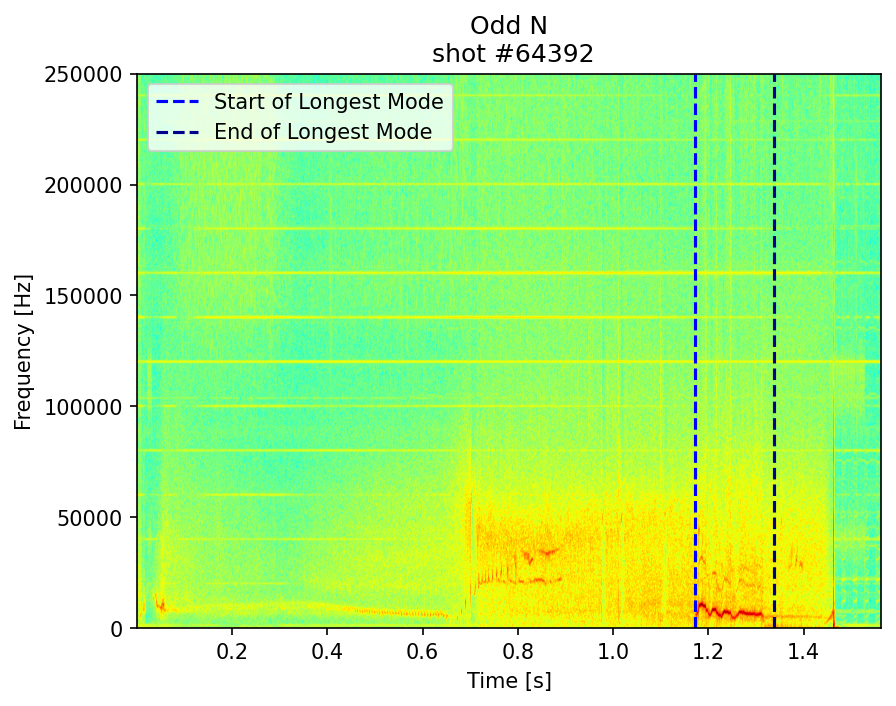

0.0005133101154457649


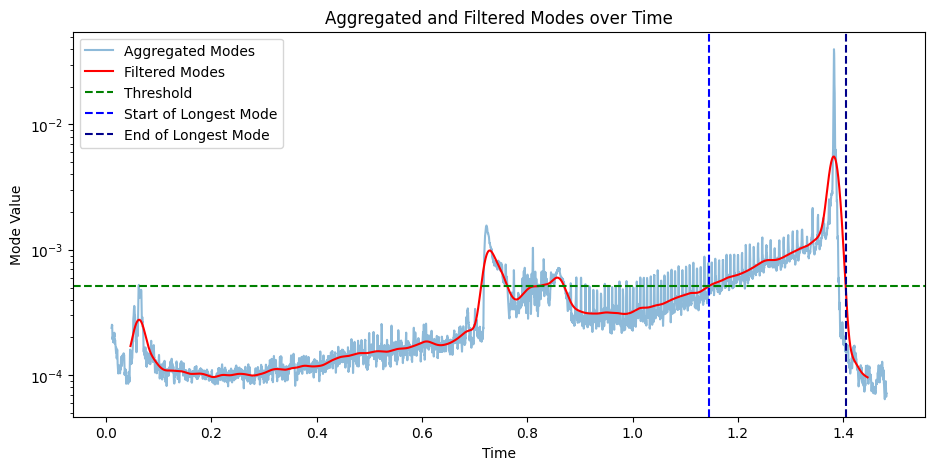

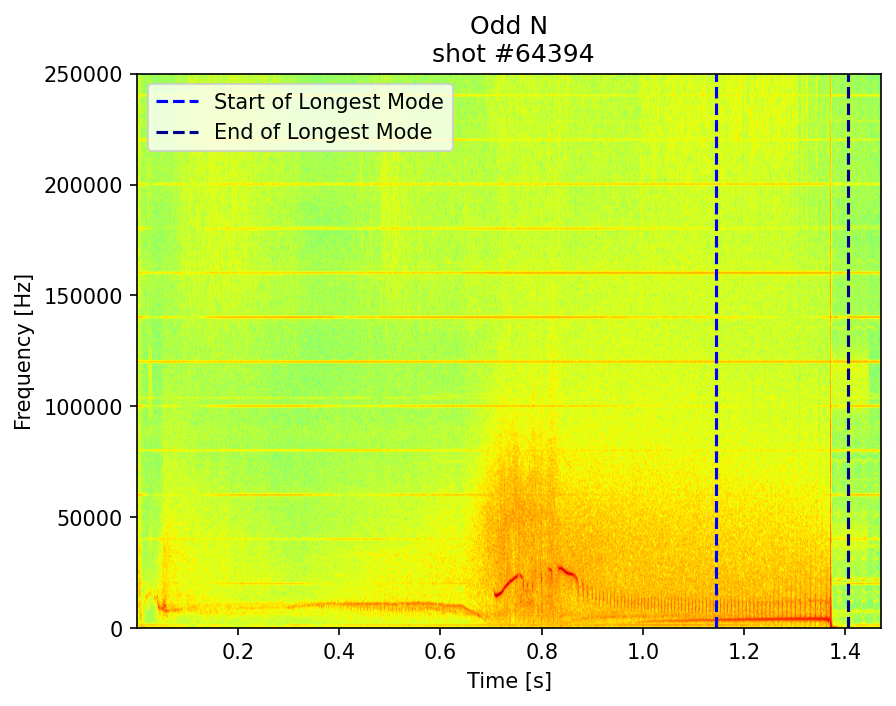

0.0006073033223674857


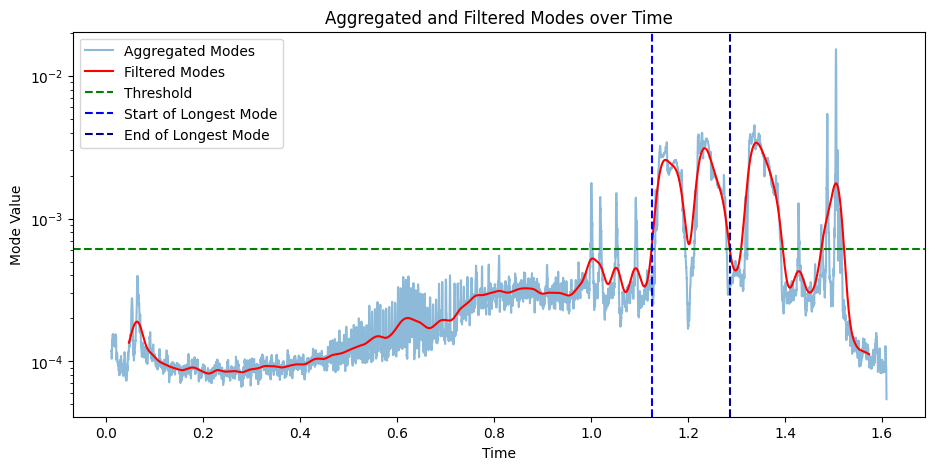

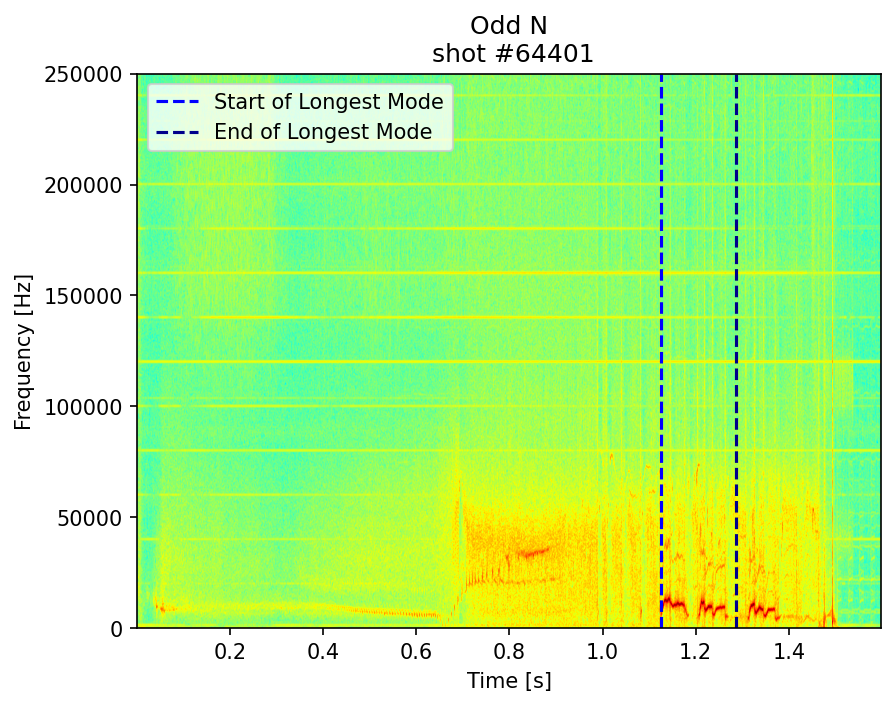

0.00011102051209987356


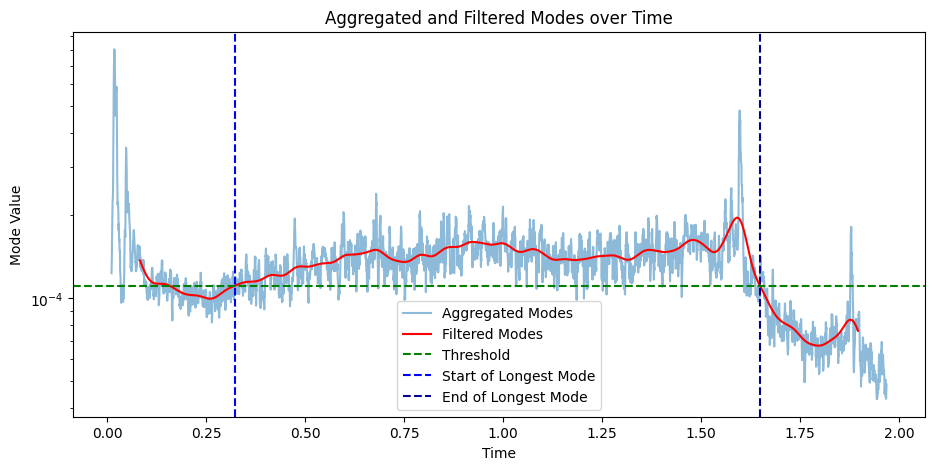

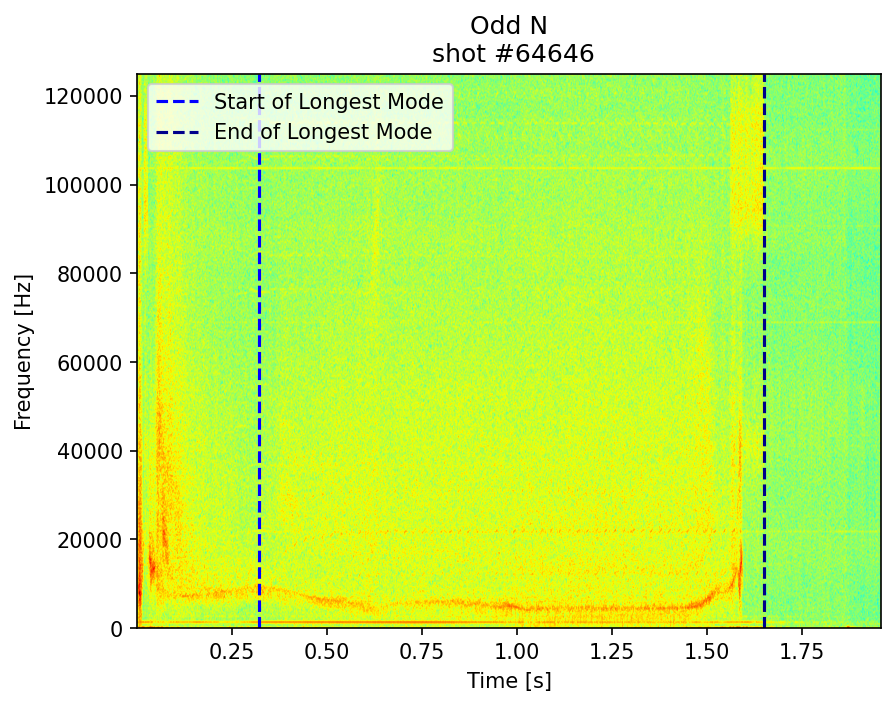

0.00038096368617571597


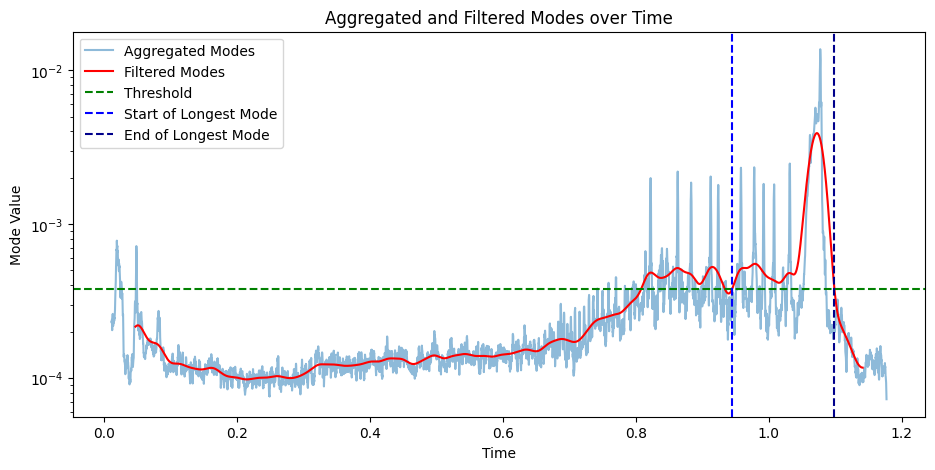

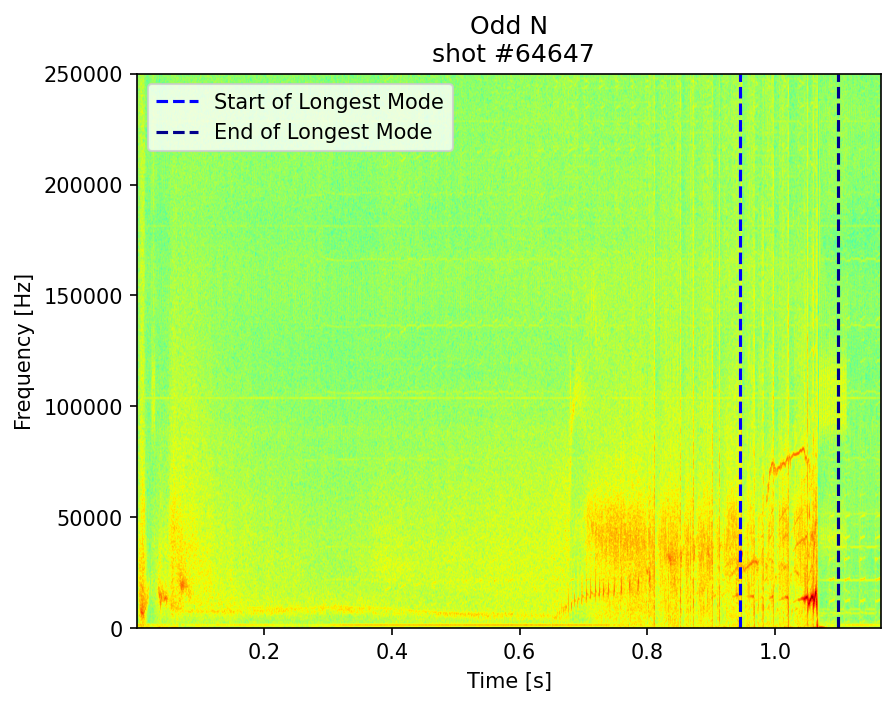

0.00045242500877003


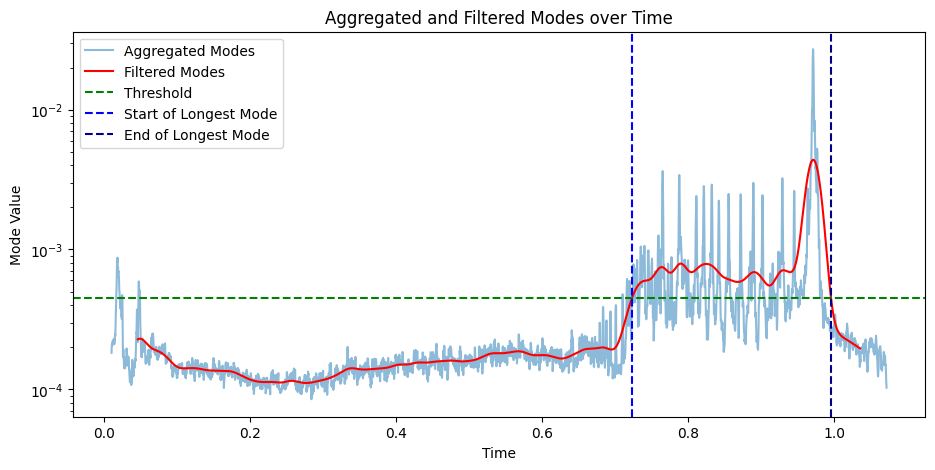

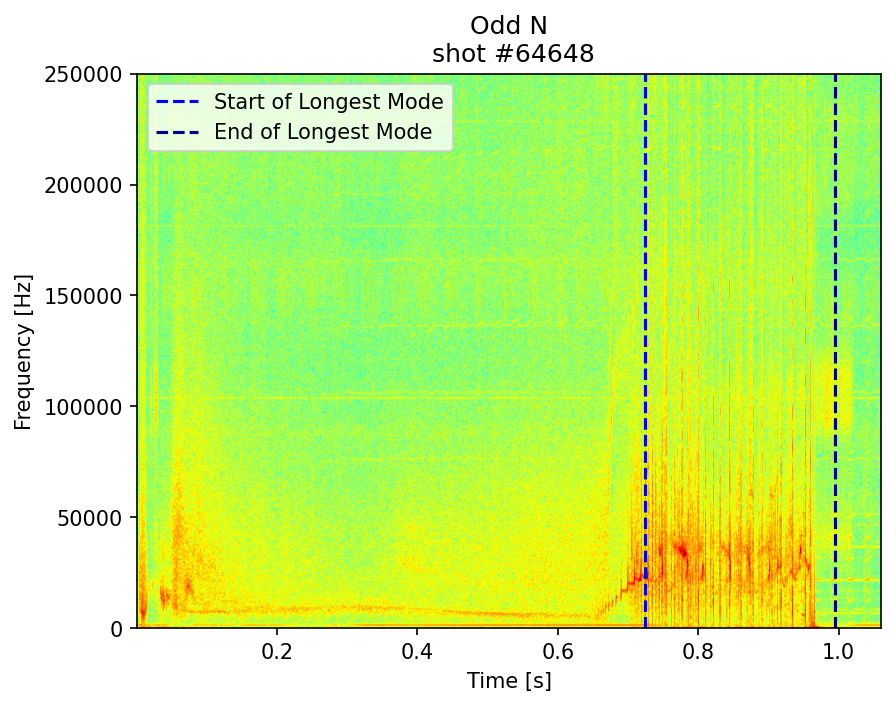

0.00047991511038344525


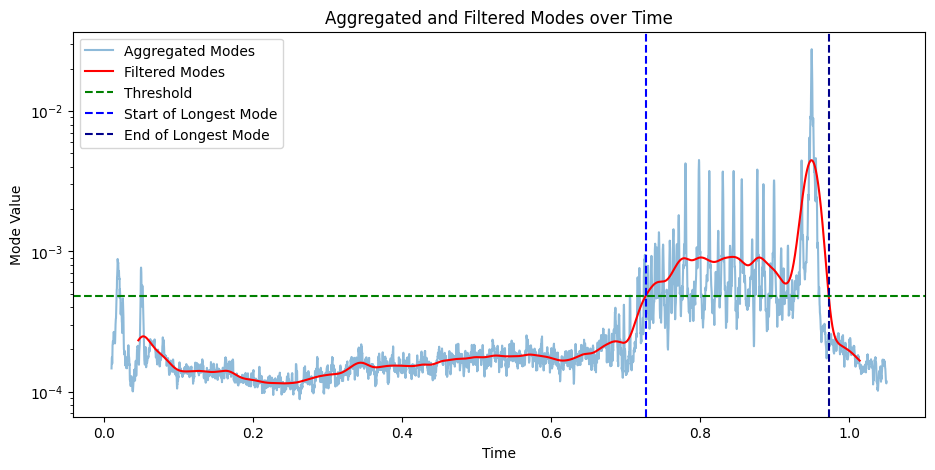

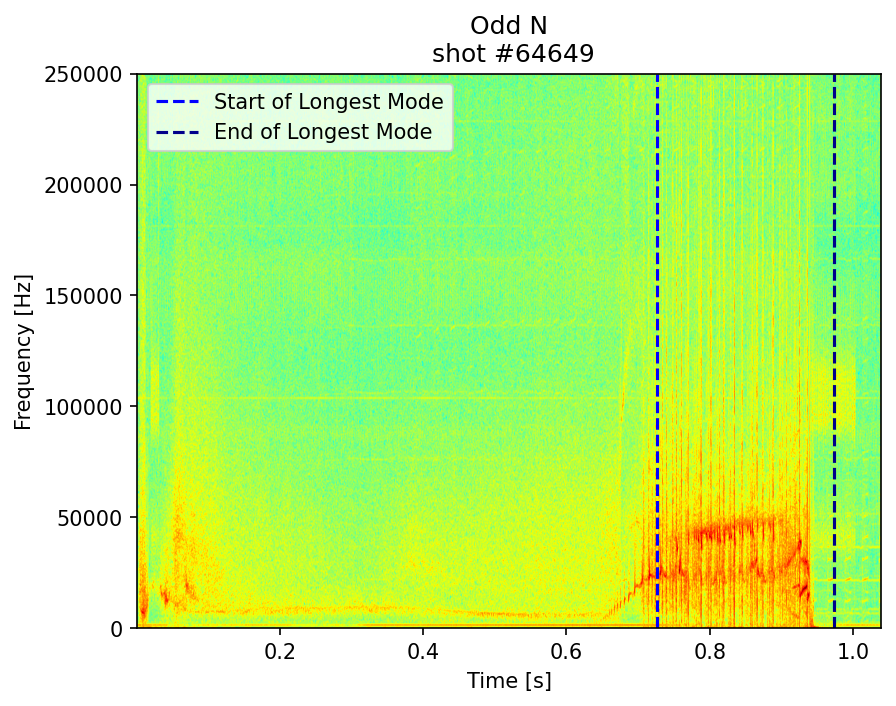

0.0005205503561810802


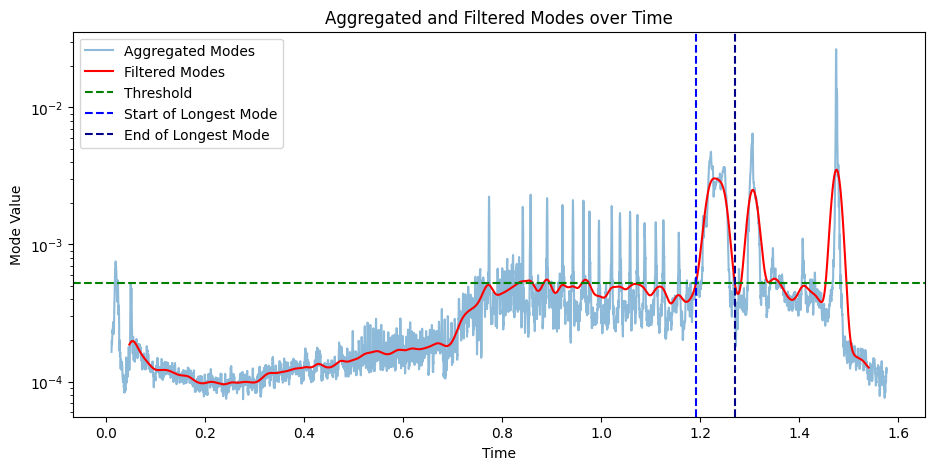

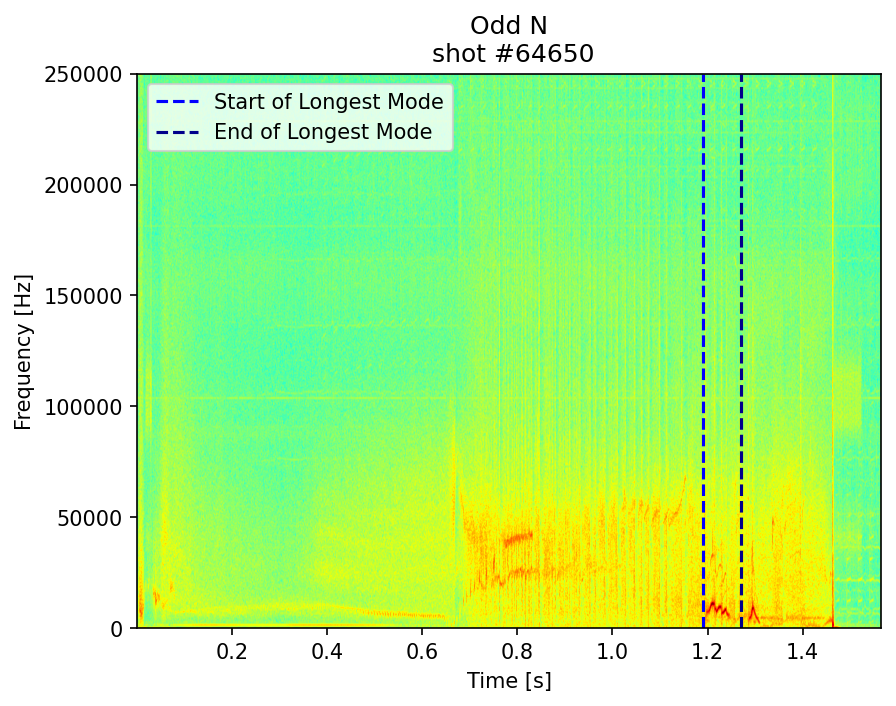

0.000768540848450847


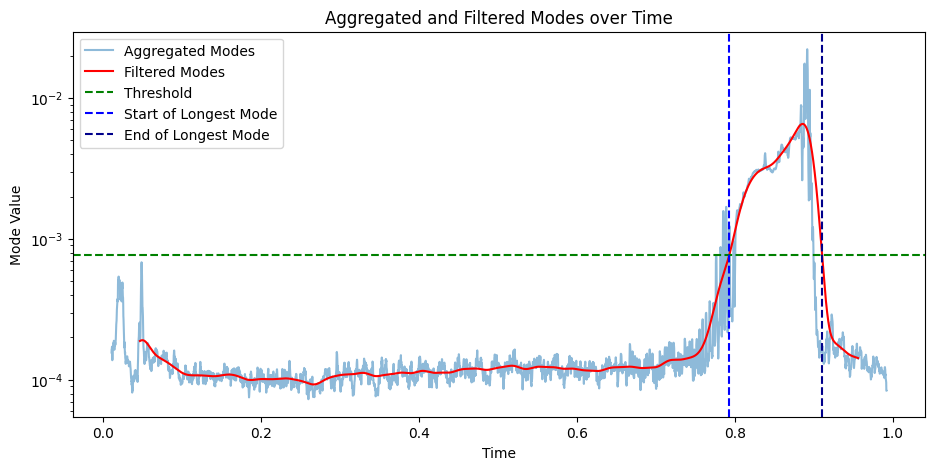

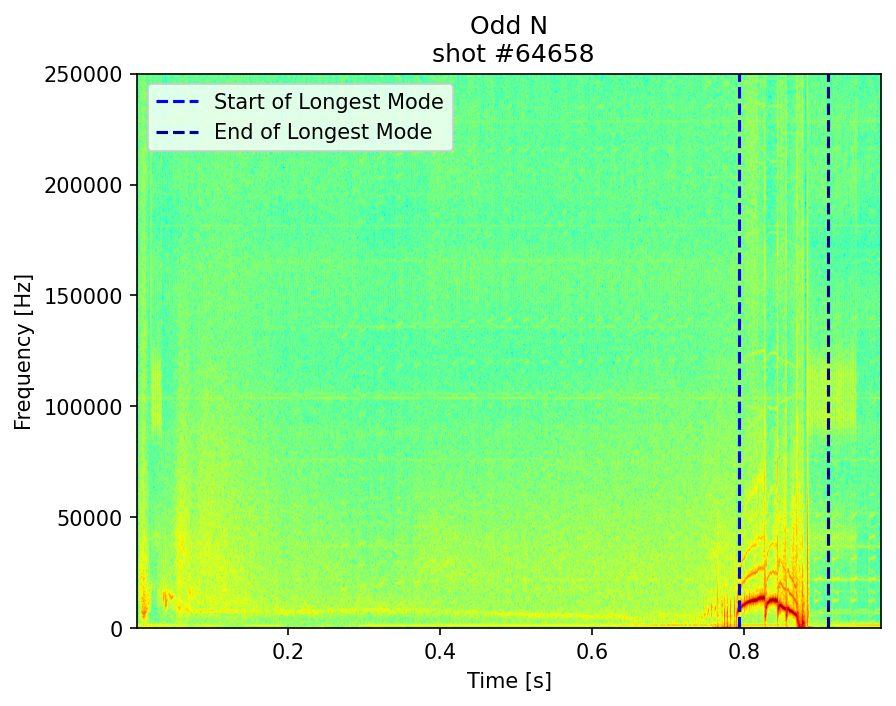

0.0003635659988352062


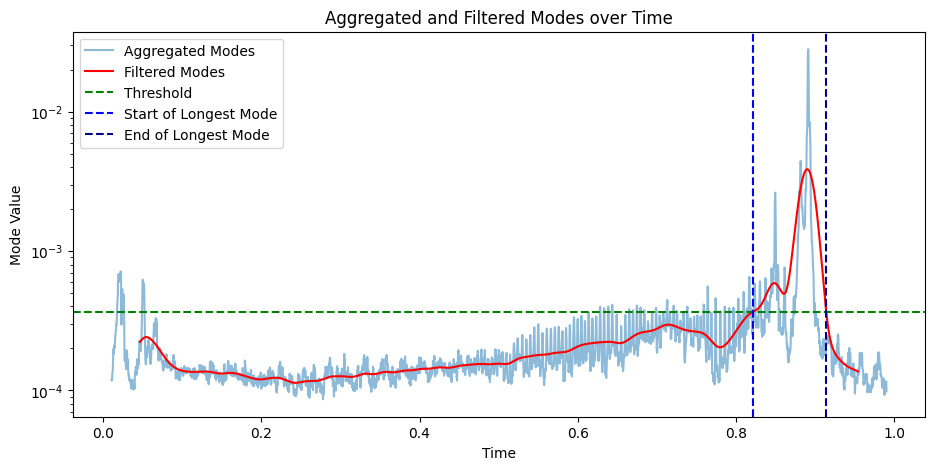

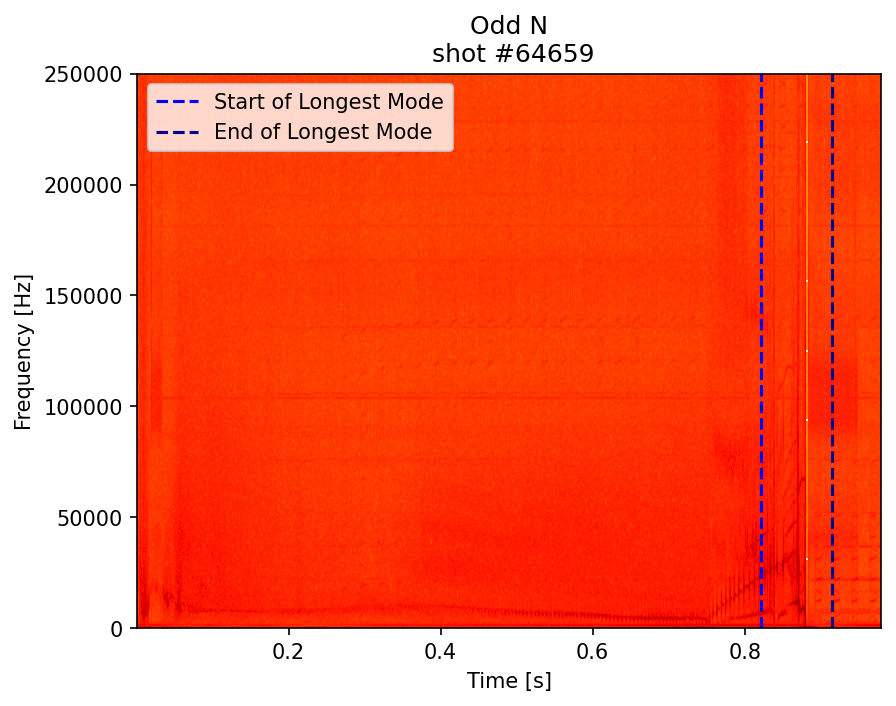

0.0006138566492919918


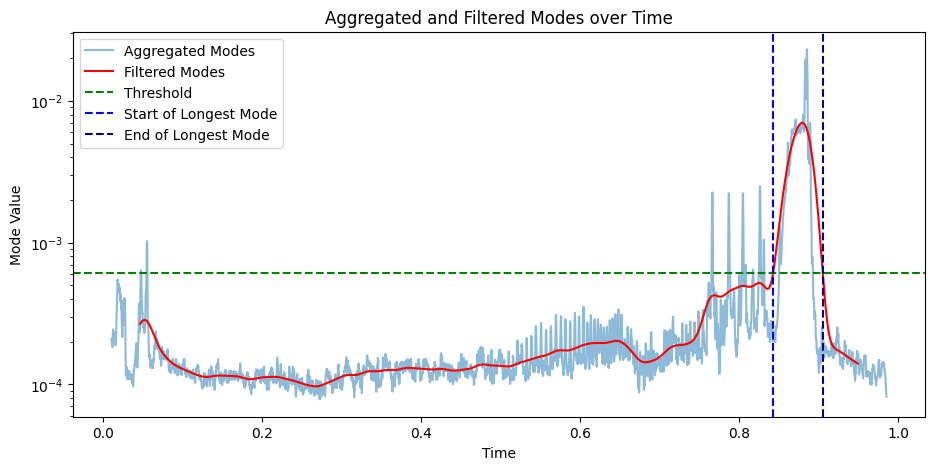

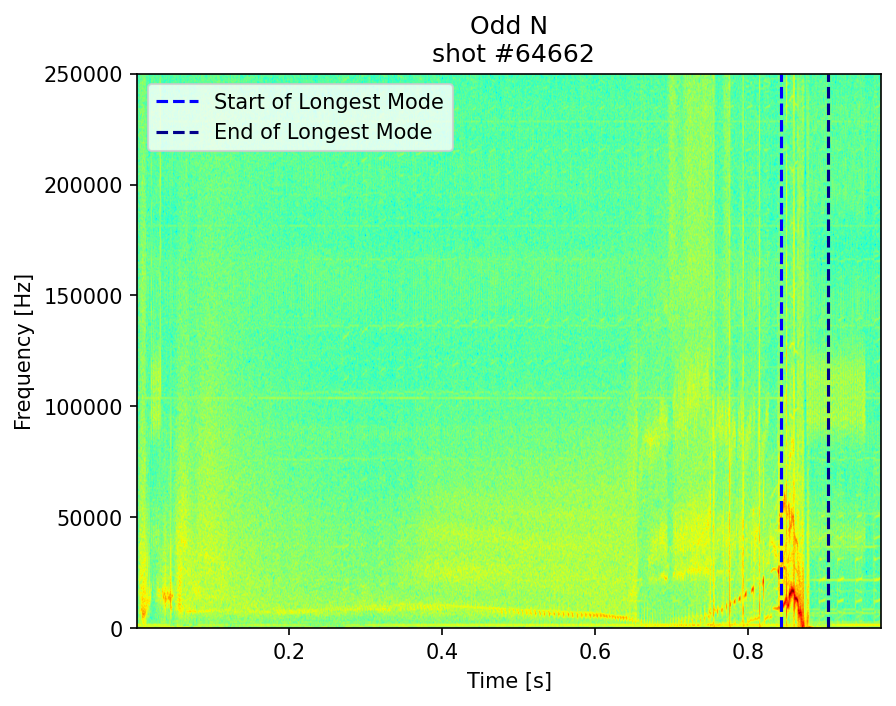

0.0005359017674110066


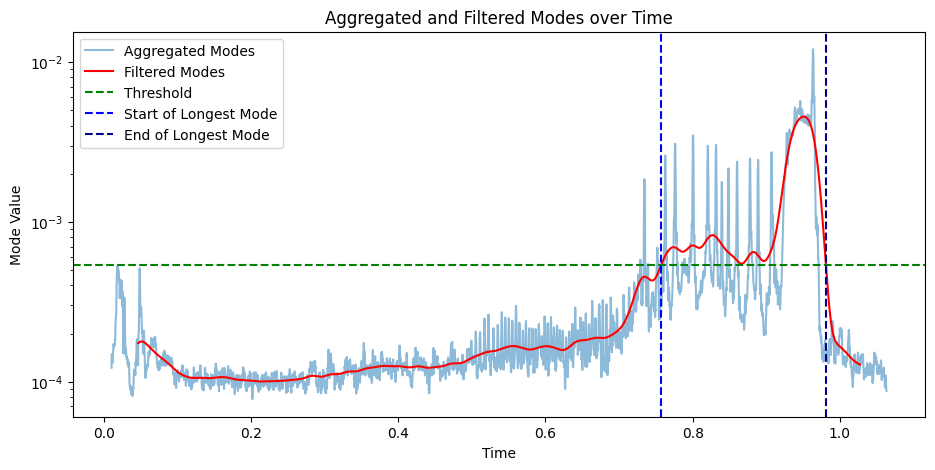

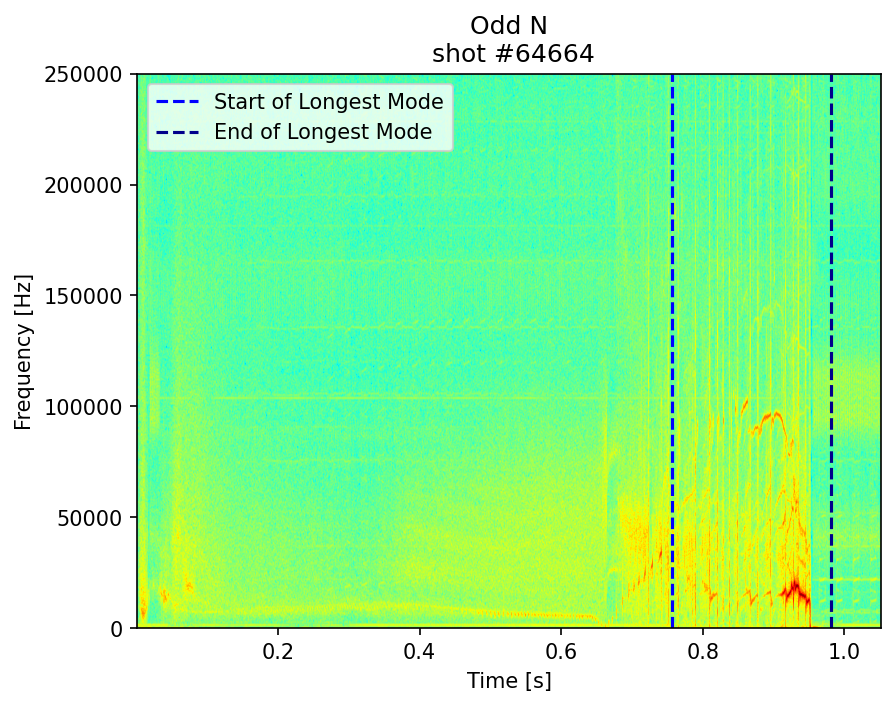

0.0005341590762868029


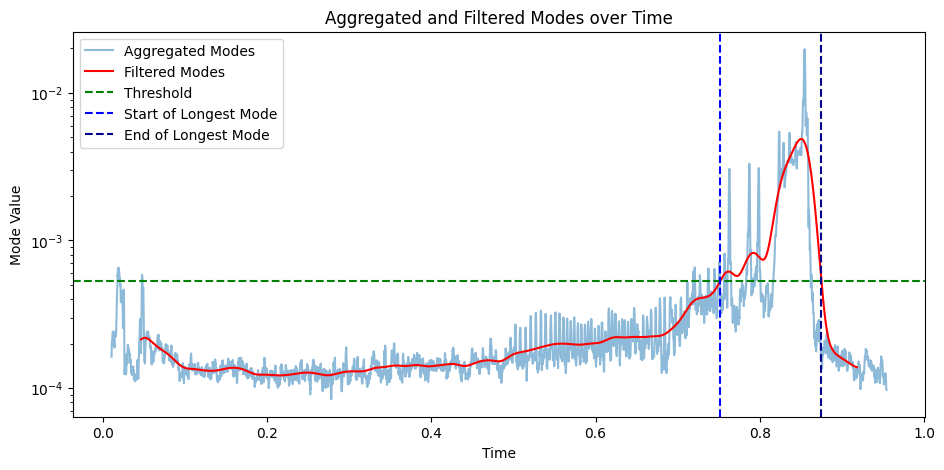

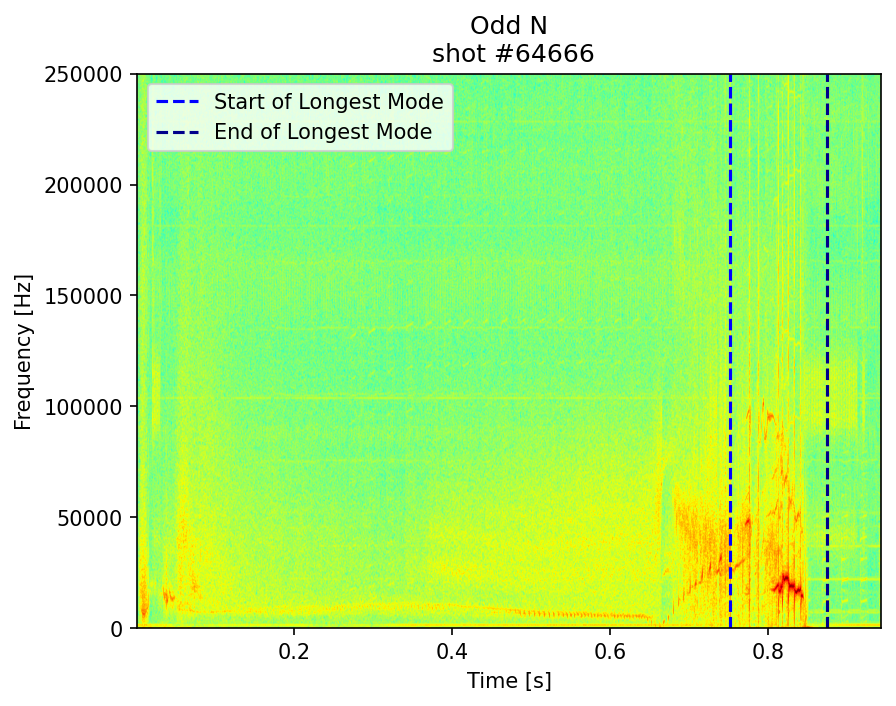

0.0009802496991315748


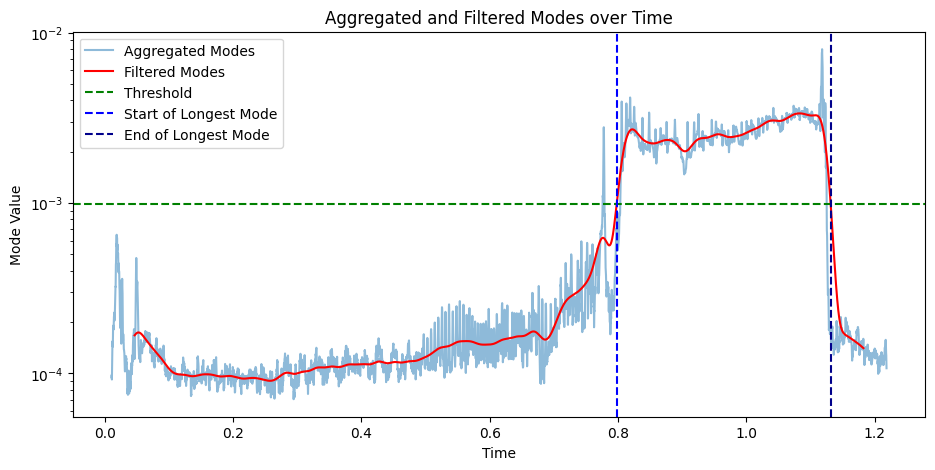

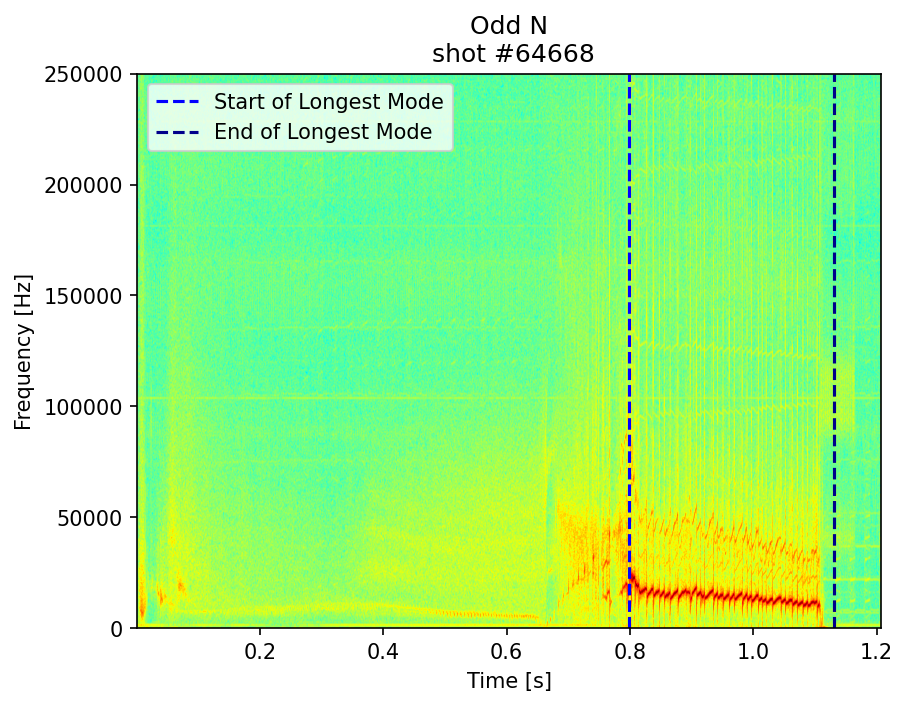

0.0005753038631713372


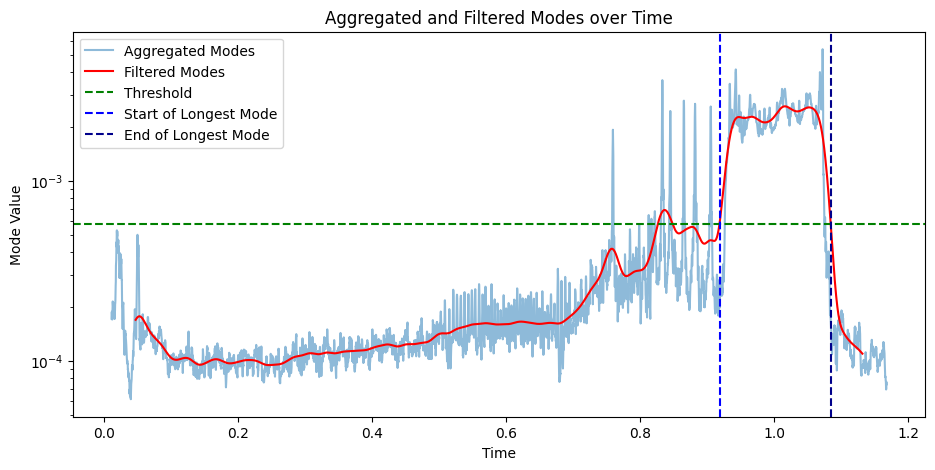

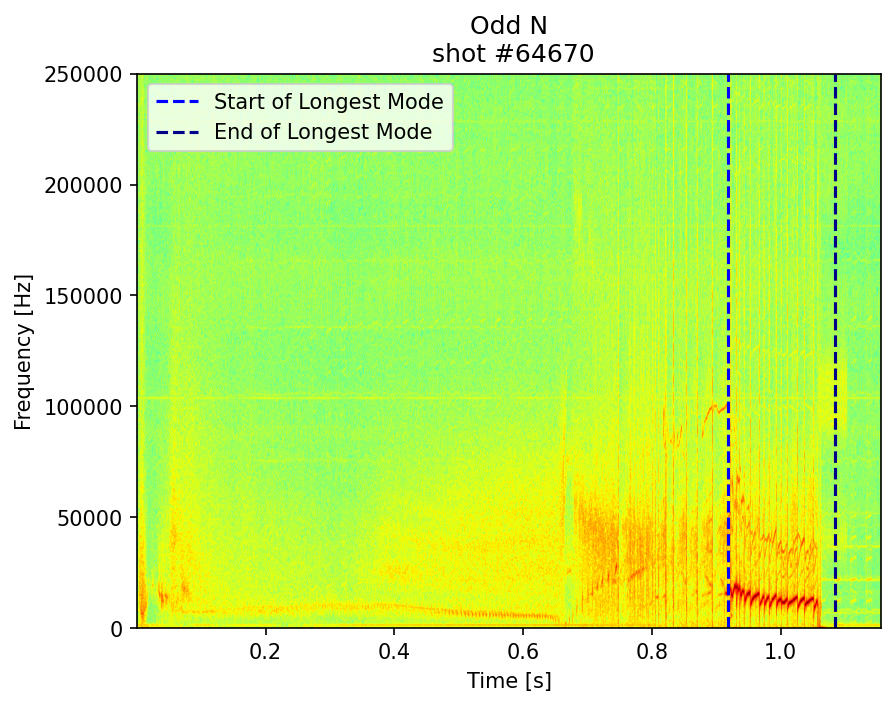

0.0016361482377442347


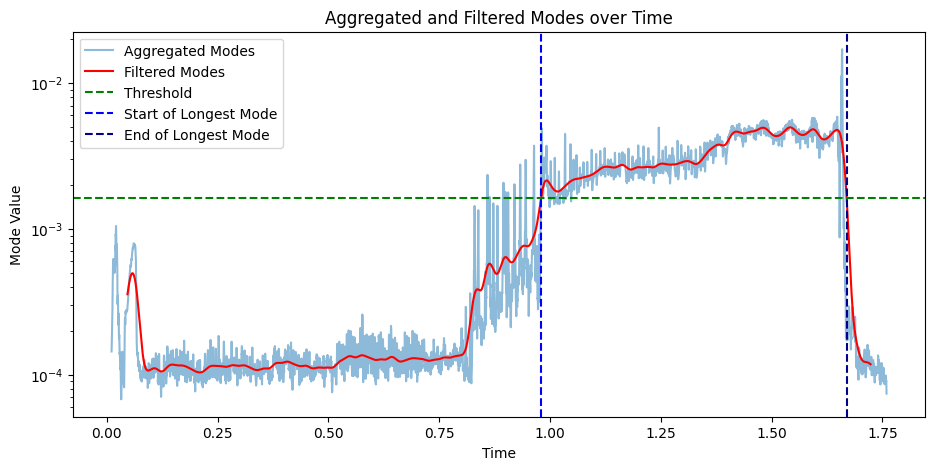

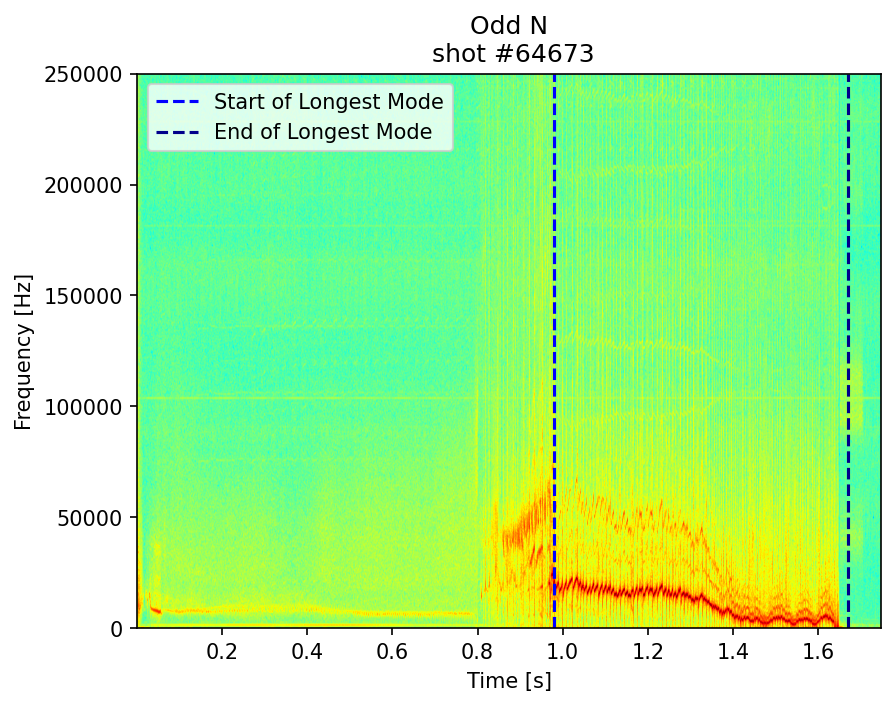

In [10]:
for shotno in all_shots[:20]:
    data_shot = load_shot(shotno, DATA_PATH, FILE_EXT)
    inputs = data_shot["x"]["spectrogram"]
    spec_odd = inputs["OddN"]
    f = inputs["frequency"]
    t = inputs["time"]

    slm, elm = plot_aggregated_modes(data_shot['y']['modes'], mode_thresh=0.0005)
    plot_spectrogram(spec_odd, f"Odd N\n shot #{shotno}", t, f, slm, elm)

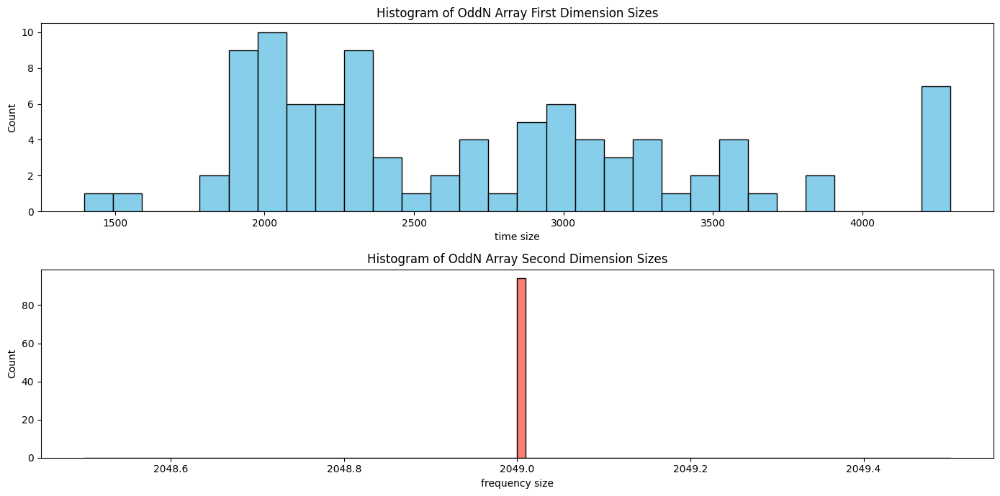

In [11]:
import matplotlib.pyplot as plt

dim1_sizes = []  # List to store the sizes of the first dimension of OddN
dim2_sizes = []  # List to store the sizes of the second dimension of OddN

for shotno in all_shots:
    data_shot = load_shot(shotno, DATA_PATH, FILE_EXT)
    inputs = data_shot["x"]["spectrogram"]
    odd_shape = inputs["OddN"].shape  # Assuming 'OddN' is a 2D array
    dim1_sizes.append(odd_shape[0])  # Size of the first dimension (e.g., frequency)
    dim2_sizes.append(odd_shape[1])  # Size of the second dimension (e.g., time)

# Plotting histograms of the dimensions
plt.figure(figsize=(14, 7))

# Histogram for the first dimension sizes
plt.subplot(2, 1, 1)
plt.hist(dim1_sizes, bins=30, color='skyblue', edgecolor='black')
plt.xlabel('time size')
plt.ylabel('Count')
plt.title('Histogram of OddN Array First Dimension Sizes')

# Histogram for the second dimension sizes
plt.subplot(2, 1, 2)
plt.hist(dim2_sizes, bins=100, color='salmon', edgecolor='black')
plt.xlabel('frequency size')
plt.ylabel('Count')
plt.title('Histogram of OddN Array Second Dimension Sizes')

plt.tight_layout()
plt.show()


In [12]:
data_shot = load_shot(all_shots[10], DATA_PATH, FILE_EXT)
timestamps = data_shot['x']['spectrogram']['time']
timesteps = []
for i in range(len(timestamps)-1):
    timesteps.append(timestamps[i+1]-timestamps[i])
timesteps # 5.12 ms timesteps, 5.12e-4 seconds

[0.0005120000000000001,
 0.0005119999999999999,
 0.0005120000000000003,
 0.0005119999999999999,
 0.0005119999999999999,
 0.0005119999999999999,
 0.0005120000000000003,
 0.0005120000000000003,
 0.0005119999999999994,
 0.0005120000000000003,
 0.0005119999999999994,
 0.0005120000000000003,
 0.0005120000000000003,
 0.0005119999999999994,
 0.0005120000000000003,
 0.0005120000000000003,
 0.0005120000000000003,
 0.0005120000000000003,
 0.0005119999999999986,
 0.0005120000000000003,
 0.0005120000000000003,
 0.0005120000000000003,
 0.0005120000000000003,
 0.0005119999999999986,
 0.0005120000000000003,
 0.0005120000000000003,
 0.0005120000000000003,
 0.0005120000000000003,
 0.0005120000000000003,
 0.0005119999999999986,
 0.000512000000000002,
 0.0005119999999999986,
 0.0005119999999999986,
 0.000512000000000002,
 0.0005119999999999986,
 0.000512000000000002,
 0.0005119999999999986,
 0.000512000000000002,
 0.0005119999999999986,
 0.0005119999999999986,
 0.000512000000000002,
 0.000511999999999998

In [13]:
spec_df = pd.DataFrame(data_shot['x']['spectrogram'][('OddN')])
spec_df.head()

,0,1,2,3,4,5,6,7,8,9,...,2039,2040,2041,2042,2043,2044,2045,2046,2047,2048
0,-72.588806,-69.902001,-70.935818,-72.909064,-76.396968,-82.656380,-82.773123,-76.433761,-72.955963,-71.128676,...,-105.147726,-102.070333,-98.485609,-96.075948,-94.431724,-93.256150,-92.396481,-91.790069,-91.423063,-94.309891
1,-75.538865,-72.845940,-73.780494,-75.201024,-76.531281,-76.531078,-74.935967,-72.936278,-71.268141,-70.118118,...,-92.866177,-94.012509,-95.826804,-98.236099,-99.428333,-96.996194,-93.817530,-91.527110,-90.208211,-92.789709
2,-81.893740,-79.127190,-79.802043,-80.744989,-81.541118,-81.038424,-78.507501,-75.328227,-72.627135,-70.678303,...,-93.572788,-93.112044,-93.144358,-93.377872,-93.268303,-92.478257,-91.310423,-90.250784,-89.560968,-92.335958
3,-84.712156,-82.177987,-83.913246,-88.404954,-99.815122,-84.791573,-78.368207,-74.543074,-72.079230,-70.578555,...,-97.812717,-94.209350,-91.836065,-90.392807,-89.761274,-89.926688,-90.967947,-93.078988,-96.454820,-102.157186
4,-85.235166,-82.477147,-83.436954,-85.646896,-88.416086,-84.533548,-78.991118,-75.112878,-72.520776,-70.917646,...,-93.930511,-92.639837,-91.947281,-91.731416,-91.892413,-92.338498,-92.972005,-93.664287,-94.228624,-97.461611


In [14]:
from torch.utils.data import Dataset

class SpectrogramDataset(Dataset):
    def __init__(self, spectrograms, instabilities, slice_length=20, overlap=0.5, time_step=5.12e-4):
        """
        spectrograms: List of spectrogram tensors
        instabilities: List of tuples (start_time, end_time) for each spectrogram
        slice_length: Number of time steps in each slice
        overlap: Fraction of overlap between consecutive slices (0 to 1)
        time_step: Duration of each time step in ms
        """
        self.spectrograms = spectrograms
        self.instabilities = instabilities
        self.slice_length = slice_length
        self.step = int(slice_length * (1 - overlap))  # Step size for moving the window
        self.time_step = time_step

        # calculate total number of slices across all spectrograms
        self.total_slices = []
        for s in self.spectrograms:
            num_slices = 1 + (s.shape[1] - slice_length) // self.step
            self.total_slices.append(num_slices)

    def __len__(self):
        return sum(self.total_slices)

    def __getitem__(self, idx):
        spectrogram_idx = 0
        # iterate through the spectrograms find which spectrogram idx belongs to
        while idx >= self.total_slices[spectrogram_idx]:
            idx -= self.total_slices[spectrogram_idx]
            spectrogram_idx += 1
        # resulting idx is now the index of the slice in spectrogram spectrogram_idx

        # compute the starting position of the slice
        start = idx * self.step
        end = start + self.slice_length

        # compute the time range of the slice
        start_time = start * self.time_step
        end_time = start_time + self.slice_length * self.time_step

        # slice the spectrogram
        slice = self.spectrograms[spectrogram_idx][:, start:end]

        # determine the label based on instabilities
        label = 0
        for instability_start, instability_end in self.instabilities[spectrogram_idx]:
            if start_time < instability_end and end_time > instability_start:
                label = 1
                break

        return slice, label

# spectrograms is a list of 2D PyTorch tensors
# instabilities is a list of lists of tuples [(start_time, end_time), ...]
dataset = SpectrogramDataset(spectrograms, instabilities, overlap=0.5)
dataloader = DataLoader(dataset, batch_size=1, shuffle=True)


NameError: name 'spectrograms' is not defined